In [228]:
import pandas as pd
import numpy as np
import datetime as dt

In [229]:
stock_df = pd.read_csv('NIFTY 50_Historical_PR_27112024to27112025.csv')
stock_df = stock_df.iloc[::-1].reset_index(drop=True)
stock_df.head(10)
stock_df.isnull().sum()

Index Name    0
Date          0
Open          0
High          0
Low           0
Close         0
dtype: int64

In [230]:
stock_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249 entries, 0 to 248
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Index Name  249 non-null    object 
 1   Date        249 non-null    object 
 2   Open        249 non-null    float64
 3   High        249 non-null    float64
 4   Low         249 non-null    float64
 5   Close       249 non-null    float64
dtypes: float64(4), object(2)
memory usage: 11.8+ KB


In [231]:
stock_df['Daily returns']=stock_df['Close'].pct_change(1)*100
stock_df

,Index Name,Date,Open,High,Low,Close,Daily returns
0,NIFTY 50,27 Nov 2024,24204.80,24354.55,24145.65,24274.90,NaN
1,NIFTY 50,28 Nov 2024,24274.15,24345.75,23873.35,23914.15,-1.486103
2,NIFTY 50,29 Nov 2024,23927.15,24188.45,23927.15,24131.10,0.907203
3,NIFTY 50,02 Dec 2024,24140.85,24301.70,24008.65,24276.05,0.600677
4,NIFTY 50,03 Dec 2024,24367.50,24481.35,24280.00,24457.15,0.746003
...,...,...,...,...,...,...,...
244,NIFTY 50,20 Nov 2025,26132.10,26246.65,26063.20,26192.15,0.535454
245,NIFTY 50,21 Nov 2025,26109.55,26179.20,26052.20,26068.15,-0.473424
246,NIFTY 50,24 Nov 2025,26122.80,26142.80,25912.15,25959.50,-0.416792
247,NIFTY 50,25 Nov 2025,25998.50,26032.60,25857.50,25884.80,-0.287756


In [232]:
stock_df['Daily returns'].replace(np.nan, 0, inplace = True)
stock_df

C:\Users\SHARADA JADHAV\AppData\Local\Temp\ipykernel_48948\3731723921.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





,Index Name,Date,Open,High,Low,Close,Daily returns
0,NIFTY 50,27 Nov 2024,24204.80,24354.55,24145.65,24274.90,0.000000
1,NIFTY 50,28 Nov 2024,24274.15,24345.75,23873.35,23914.15,-1.486103
2,NIFTY 50,29 Nov 2024,23927.15,24188.45,23927.15,24131.10,0.907203
3,NIFTY 50,02 Dec 2024,24140.85,24301.70,24008.65,24276.05,0.600677
4,NIFTY 50,03 Dec 2024,24367.50,24481.35,24280.00,24457.15,0.746003
...,...,...,...,...,...,...,...
244,NIFTY 50,20 Nov 2025,26132.10,26246.65,26063.20,26192.15,0.535454
245,NIFTY 50,21 Nov 2025,26109.55,26179.20,26052.20,26068.15,-0.473424
246,NIFTY 50,24 Nov 2025,26122.80,26142.80,25912.15,25959.50,-0.416792
247,NIFTY 50,25 Nov 2025,25998.50,26032.60,25857.50,25884.80,-0.287756


In [233]:
stock_df.describe().round(2)

,Open,High,Low,Close,Daily returns
count,249.00,249.00,249.00,249.00,249.00
mean,24402.25,24511.55,24288.80,24402.13,0.03
std,1005.95,991.47,1015.09,1002.42,0.77
min,21758.40,22105.05,21743.65,22082.65,-3.24
25%,23637.65,23736.50,23451.70,23603.35,-0.40
50%,24639.50,24754.35,24535.25,24641.80,0.00
75%,25118.90,25192.50,25035.55,25090.70,0.47
max,26132.10,26246.65,26063.20,26205.30,3.82


In [234]:
import matplotlib.pyplot as plt
!pip install seaborn
import seaborn as sns
import plotly.express as px

In [235]:
fig = px.line(title = 'Nifty50 Adjusted close price')
fig.add_scatter(x= stock_df['Date'],y= stock_df['Close'], name= 'Adj Close')

In [236]:
def plot_financial_data(df, title):

    fig= px.line(title = title)
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'],y = df[i], name = i)
        fig.update_traces(line_width = 5)
        fig.update_layout({'plot_bgcolor': "white"})

    fig.show()

In [237]:
plot_financial_data(stock_df.drop(['Index Name','Daily returns'],axis = 1),'Nifty50 Close Price')

In [238]:
plot_financial_data(stock_df.iloc[:,[1,5]], 'Nifty50 % daily returns')

In [239]:
def percentage_return_classifier(percentage_return):
    if percentage_return > -0.3 and percentage_return<=0.3:
        return 'Insignificant change'
    elif percentage_return>0.3 and percentage_return<=3:
        return 'Positive change'
    elif percentage_return>-3 and percentage_return<=-0.3:
        return 'Negative change'
    elif percentage_return>3 and percentage_return<=7:
        return 'Large Positive change'
    elif percentage_return>-7 and percentage_return<=-3:
        return 'Large Negative change'
    elif percentage_return>7:
        return 'Bull run'
    elif percentage_return<=-7:
        return 'Bear sell off'
    

In [240]:
stock_df['Trend'] = stock_df['Daily returns'].apply(percentage_return_classifier)
stock_df

,Index Name,Date,Open,High,Low,Close,Daily returns,Trend
0,NIFTY 50,27 Nov 2024,24204.80,24354.55,24145.65,24274.90,0.000000,Insignificant change
1,NIFTY 50,28 Nov 2024,24274.15,24345.75,23873.35,23914.15,-1.486103,Negative change
2,NIFTY 50,29 Nov 2024,23927.15,24188.45,23927.15,24131.10,0.907203,Positive change
3,NIFTY 50,02 Dec 2024,24140.85,24301.70,24008.65,24276.05,0.600677,Positive change
4,NIFTY 50,03 Dec 2024,24367.50,24481.35,24280.00,24457.15,0.746003,Positive change
...,...,...,...,...,...,...,...,...
244,NIFTY 50,20 Nov 2025,26132.10,26246.65,26063.20,26192.15,0.535454,Positive change
245,NIFTY 50,21 Nov 2025,26109.55,26179.20,26052.20,26068.15,-0.473424,Negative change
246,NIFTY 50,24 Nov 2025,26122.80,26142.80,25912.15,25959.50,-0.416792,Negative change
247,NIFTY 50,25 Nov 2025,25998.50,26032.60,25857.50,25884.80,-0.287756,Insignificant change


In [241]:
trend_summary = stock_df['Trend'].value_counts()
trend_summary

Trend
Positive change          87
Insignificant change     80
Negative change          80
Large Negative change     1
Large Positive change     1
Name: count, dtype: int64

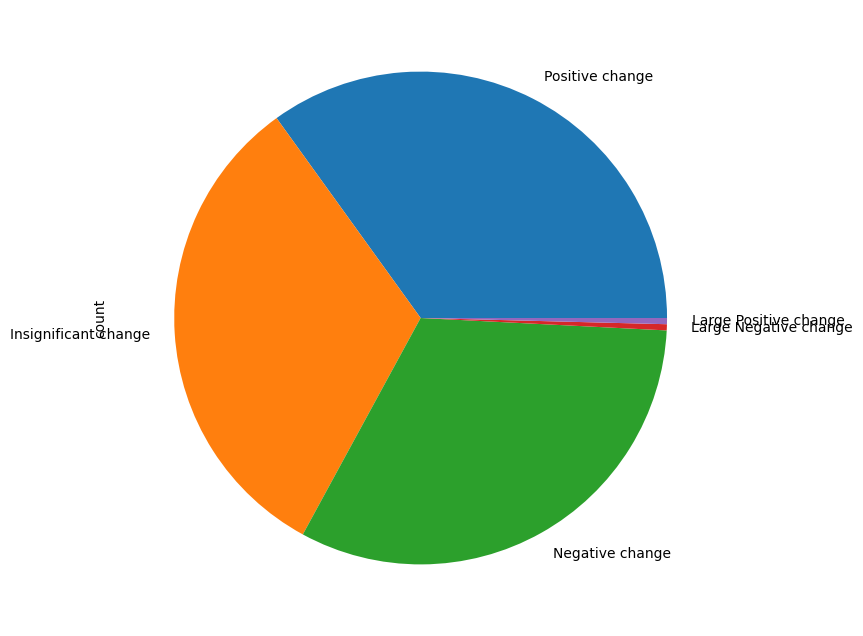

In [242]:
plt.figure(figsize = (8,8))
trend_summary.plot(kind = 'pie', y = 'Trend');

In [243]:
! pip install cufflinks
import cufflinks as cf
cf.go_offline()

In [244]:
stock_df

,Index Name,Date,Open,High,Low,Close,Daily returns,Trend
0,NIFTY 50,27 Nov 2024,24204.80,24354.55,24145.65,24274.90,0.000000,Insignificant change
1,NIFTY 50,28 Nov 2024,24274.15,24345.75,23873.35,23914.15,-1.486103,Negative change
2,NIFTY 50,29 Nov 2024,23927.15,24188.45,23927.15,24131.10,0.907203,Positive change
3,NIFTY 50,02 Dec 2024,24140.85,24301.70,24008.65,24276.05,0.600677,Positive change
4,NIFTY 50,03 Dec 2024,24367.50,24481.35,24280.00,24457.15,0.746003,Positive change
...,...,...,...,...,...,...,...,...
244,NIFTY 50,20 Nov 2025,26132.10,26246.65,26063.20,26192.15,0.535454,Positive change
245,NIFTY 50,21 Nov 2025,26109.55,26179.20,26052.20,26068.15,-0.473424,Negative change
246,NIFTY 50,24 Nov 2025,26122.80,26142.80,25912.15,25959.50,-0.416792,Negative change
247,NIFTY 50,25 Nov 2025,25998.50,26032.60,25857.50,25884.80,-0.287756,Insignificant change


In [245]:
stock_df.set_index(['Date'],inplace = True)
stock_df

,Index Name,Open,High,Low,Close,Daily returns,Trend
Date,,,,,,,
27 Nov 2024,NIFTY 50,24204.80,24354.55,24145.65,24274.90,0.000000,Insignificant change
28 Nov 2024,NIFTY 50,24274.15,24345.75,23873.35,23914.15,-1.486103,Negative change
29 Nov 2024,NIFTY 50,23927.15,24188.45,23927.15,24131.10,0.907203,Positive change
02 Dec 2024,NIFTY 50,24140.85,24301.70,24008.65,24276.05,0.600677,Positive change
03 Dec 2024,NIFTY 50,24367.50,24481.35,24280.00,24457.15,0.746003,Positive change
...,...,...,...,...,...,...,...
20 Nov 2025,NIFTY 50,26132.10,26246.65,26063.20,26192.15,0.535454,Positive change
21 Nov 2025,NIFTY 50,26109.55,26179.20,26052.20,26068.15,-0.473424,Negative change
24 Nov 2025,NIFTY 50,26122.80,26142.80,25912.15,25959.50,-0.416792,Negative change


In [246]:
# Minimal, reliable Plotly replacement (copy-paste)
import plotly.graph_objs as go
from plotly.offline import iplot

# compute SMAs
stock_df['SMA_2'] = stock_df['Close'].rolling(2, min_periods=1).mean()
stock_df['SMA_250'] = stock_df['Close'].rolling(250, min_periods=1).mean()

# traces
candle = go.Candlestick(x=stock_df.index,
                       open=stock_df['Open'], high=stock_df['High'],
                       low=stock_df['Low'], close=stock_df['Close'],
                       name='Price')

sma2 = go.Scatter(x=stock_df.index, y=stock_df['SMA_2'],
                   mode='lines', name='SMA 2', line={'color':'magenta','width':1.5})
sma250 = go.Scatter(x=stock_df.index, y=stock_df['SMA_250'],
                   mode='lines', name='SMA 250', line={'color':'green','width':1.5})

fig = go.Figure(data=[candle, sma2, sma250])
fig.update_layout(title='Nifty50 Candlestick Chart', yaxis_title='Price', xaxis_title='Date')
iplot(fig)

In [247]:
! pip install yfinance

In [248]:
import yfinance as yf
import pandas as pd

# list of stock tickers (example: Indian stocks with .NS suffix)
tickers = ['HDFCBANK.NS', 'RELIANCE.NS', 'TCS.NS', 'INFY.NS', 'ICICIBANK.NS', '^NSEI']

# download OHLCV data for all stocks
data = yf.download(tickers, start='2015-01-01', end='2024-12-31')

# flatten multi-index columns
data.columns = ['_'.join(col).strip() for col in data.columns.values]

# save to CSV
data.to_csv('multi_stock_data.csv')

print("Saved as multi_stock_data.csv")


C:\Users\SHARADA JADHAV\AppData\Local\Temp\ipykernel_48948\1355643626.py:8: FutureWarning:

YF.download() has changed argument auto_adjust default to True

[*********************100%***********************]  6 of 6 completed

Saved as multi_stock_data.csv


In [249]:
close_price_df = pd.read_csv('multi_stock_data.csv')
close_price_df

,Date,Close_HDFCBANK.NS,Close_ICICIBANK.NS,Close_INFY.NS,Close_RELIANCE.NS,Close_TCS.NS,Close_^NSEI,High_HDFCBANK.NS,High_ICICIBANK.NS,High_INFY.NS,...,Open_INFY.NS,Open_RELIANCE.NS,Open_TCS.NS,Open_^NSEI,Volume_HDFCBANK.NS,Volume_ICICIBANK.NS,Volume_INFY.NS,Volume_RELIANCE.NS,Volume_TCS.NS,Volume_^NSEI
0,2015-01-01,217.235336,294.023865,367.770844,189.999786,1006.856445,NaN,217.771559,294.983623,369.186488,...,366.755660,189.657416,1015.340671,NaN,3544940,2583280,2002764,2963643,366830,NaN
1,2015-01-02,220.258682,302.369690,374.998016,189.496964,1020.265198,8395.450195,221.171388,303.371193,376.087712,...,367.323717,190.042631,1009.012219,8288.700195,5900384,8272990,6778320,7331366,925740,101900.0
2,2015-01-05,218.399063,302.995636,371.775635,187.421265,1004.760254,8378.400391,221.456619,306.626088,378.127426,...,374.383410,189.379255,1020.878345,8407.950195,4796000,10316090,9937024,10103941,1754242,118200.0
3,2015-01-06,214.999222,290.143005,364.008118,178.915222,967.717896,8127.350098,218.262142,300.366673,369.745232,...,368.813883,186.169417,1000.349598,8325.299805,8219680,13282427,9667316,18627980,2423784,172800.0
4,2015-01-07,215.626694,282.297974,365.749817,182.809814,956.287109,8102.100098,217.075608,288.974652,367.836028,...,366.019899,179.129229,976.973656,8118.649902,5746112,21254332,7249916,20720312,2636332,164100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,2024-12-23,888.490295,1286.870483,1868.988525,1217.437744,4018.517822,23753.449219,890.956954,1296.992334,1884.237202,...,1874.573249,1210.166735,4058.864389,23738.199219,11044592,6827512,2781793,10052824,2195338,189800.0
2462,2024-12-24,887.059631,1287.317017,1854.176880,1217.885864,4039.005859,23727.650391,892.288935,1294.511504,1886.179727,...,1871.659493,1217.437703,4018.518310,23769.099609,14485834,7138516,2360544,6734917,1181886,177700.0
2463,2024-12-26,883.433655,1287.416138,1852.574341,1211.710571,4028.955322,23750.199219,893.916952,1302.698244,1864.569333,...,1854.176937,1219.379892,4039.005631,23775.800781,10481678,7338444,3623321,10016178,1208464,177700.0
2464,2024-12-27,887.133667,1297.538208,1861.655518,1216.192749,4024.848145,23813.400391,890.932297,1305.873793,1868.842838,...,1854.516807,1213.453688,4023.060238,23801.400391,7259330,4756066,3937500,7000397,858100,176800.0


In [250]:
close_price_df = close_price_df.iloc[:, :7]
close_price_df

,Date,Close_HDFCBANK.NS,Close_ICICIBANK.NS,Close_INFY.NS,Close_RELIANCE.NS,Close_TCS.NS,Close_^NSEI
0,2015-01-01,217.235336,294.023865,367.770844,189.999786,1006.856445,NaN
1,2015-01-02,220.258682,302.369690,374.998016,189.496964,1020.265198,8395.450195
2,2015-01-05,218.399063,302.995636,371.775635,187.421265,1004.760254,8378.400391
3,2015-01-06,214.999222,290.143005,364.008118,178.915222,967.717896,8127.350098
4,2015-01-07,215.626694,282.297974,365.749817,182.809814,956.287109,8102.100098
...,...,...,...,...,...,...,...
2461,2024-12-23,888.490295,1286.870483,1868.988525,1217.437744,4018.517822,23753.449219
2462,2024-12-24,887.059631,1287.317017,1854.176880,1217.885864,4039.005859,23727.650391
2463,2024-12-26,883.433655,1287.416138,1852.574341,1211.710571,4028.955322,23750.199219
2464,2024-12-27,887.133667,1297.538208,1861.655518,1216.192749,4024.848145,23813.400391


In [251]:
daily_returns_df = close_price_df.iloc[:,1:].pct_change()*100
daily_returns_df.replace(np.nan, 0, inplace = True)
daily_returns_df

C:\Users\SHARADA JADHAV\AppData\Local\Temp\ipykernel_48948\2529913826.py:1: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



,Close_HDFCBANK.NS,Close_ICICIBANK.NS,Close_INFY.NS,Close_RELIANCE.NS,Close_TCS.NS,Close_^NSEI
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1.391738,2.838486,1.965129,-0.264644,1.331744,0.000000
2,-0.844289,0.207013,-0.859306,-1.095373,-1.519697,-0.203084
3,-1.556711,-4.241853,-2.089302,-4.538462,-3.686686,-2.996399
4,0.291848,-2.703850,0.478478,2.176781,-1.181211,-0.310679
...,...,...,...,...,...,...
2461,1.665255,0.651972,0.111850,1.410437,-0.287751,0.703547
2462,-0.161022,0.034699,-0.792495,0.036808,0.509841,-0.108611
2463,-0.408764,0.007700,-0.086429,-0.507050,-0.248837,0.095032
2464,0.418822,0.786231,0.490192,0.369905,-0.101942,0.266108


In [252]:
daily_returns_df.insert(0, 'Date', close_price_df['Date'])
daily_returns_df

,Date,Close_HDFCBANK.NS,Close_ICICIBANK.NS,Close_INFY.NS,Close_RELIANCE.NS,Close_TCS.NS,Close_^NSEI
0,2015-01-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2015-01-02,1.391738,2.838486,1.965129,-0.264644,1.331744,0.000000
2,2015-01-05,-0.844289,0.207013,-0.859306,-1.095373,-1.519697,-0.203084
3,2015-01-06,-1.556711,-4.241853,-2.089302,-4.538462,-3.686686,-2.996399
4,2015-01-07,0.291848,-2.703850,0.478478,2.176781,-1.181211,-0.310679
...,...,...,...,...,...,...,...
2461,2024-12-23,1.665255,0.651972,0.111850,1.410437,-0.287751,0.703547
2462,2024-12-24,-0.161022,0.034699,-0.792495,0.036808,0.509841,-0.108611
2463,2024-12-26,-0.408764,0.007700,-0.086429,-0.507050,-0.248837,0.095032
2464,2024-12-27,0.418822,0.786231,0.490192,0.369905,-0.101942,0.266108


In [253]:
plot_financial_data(close_price_df, 'Close prices')

In [254]:
plot_financial_data(daily_returns_df, '% Daily Returns')

In [255]:
fig = px.histogram(daily_returns_df.drop(columns = ['Date']))
fig.update_layout({'plot_bgcolor' : 'white'})

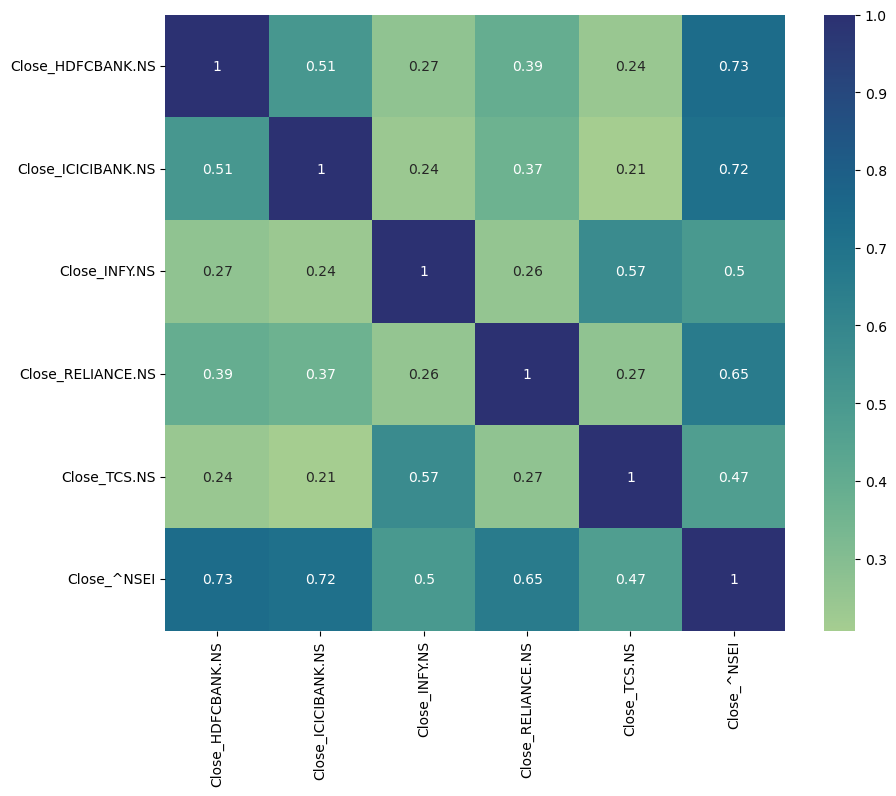

In [256]:
plt.figure(figsize = (10, 8))
sns.heatmap(daily_returns_df.drop(columns = ['Date']).corr(),annot = True, cmap = "crest");

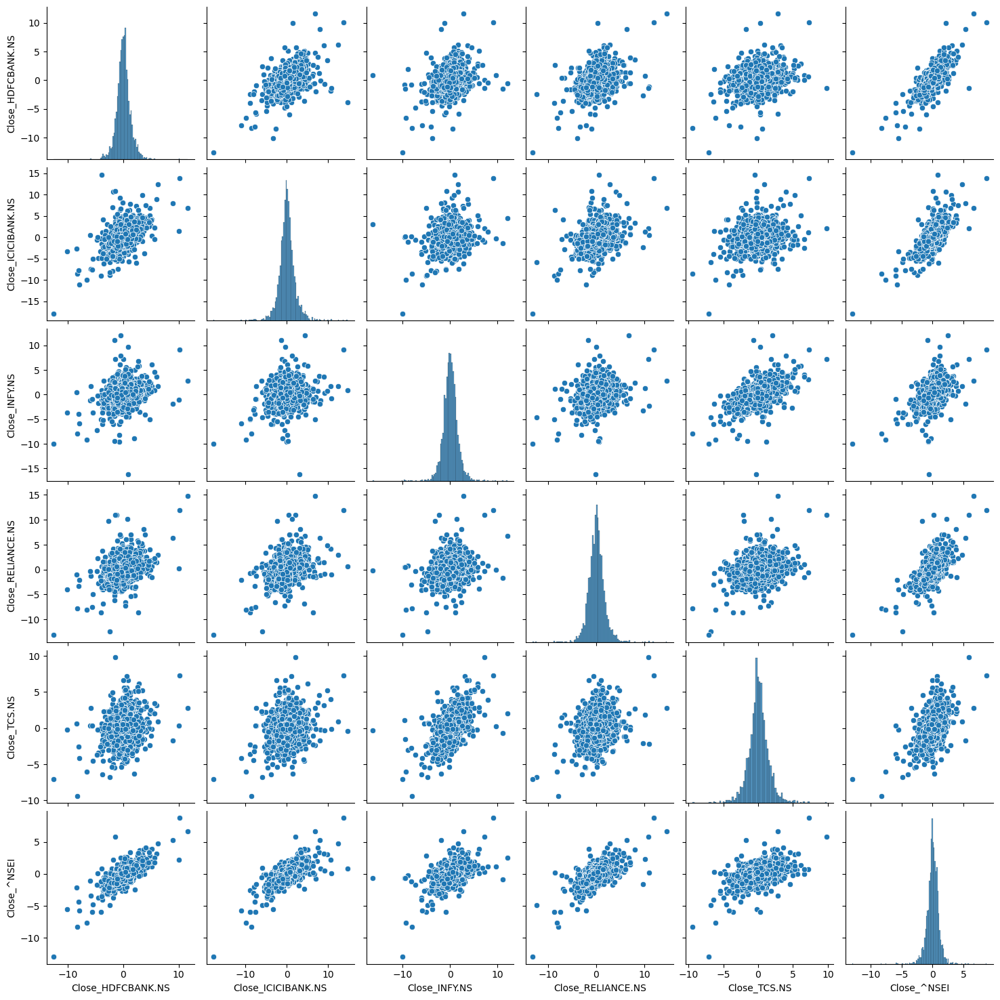

In [257]:
sns.pairplot(daily_returns_df);

In [258]:
def price_scaling(raw_prices_df):
    scaled_prices_df = raw_prices_df.copy()
    for i in raw_prices_df.columns[1:]:
        scaled_prices_df[i] = raw_prices_df[i]/raw_prices_df[i][0]
    return scaled_prices_df

In [259]:
price_scaling(close_price_df)

,Date,Close_HDFCBANK.NS,Close_ICICIBANK.NS,Close_INFY.NS,Close_RELIANCE.NS,Close_TCS.NS,Close_^NSEI
0,2015-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,NaN
1,2015-01-02,1.013917,1.028385,1.019651,0.997354,1.013317,NaN
2,2015-01-05,1.005357,1.030514,1.010889,0.986429,0.997918,NaN
3,2015-01-06,0.989706,0.986801,0.989769,0.941660,0.961128,NaN
4,2015-01-07,0.992595,0.960119,0.994505,0.962158,0.949775,NaN
...,...,...,...,...,...,...,...
2461,2024-12-23,4.089990,4.376755,5.081938,6.407574,3.991153,NaN
2462,2024-12-24,4.083404,4.378274,5.041664,6.409933,4.011501,NaN
2463,2024-12-26,4.066712,4.378611,5.037306,6.377431,4.001519,NaN
2464,2024-12-27,4.083745,4.413037,5.061999,6.401022,3.997440,NaN


In [260]:
import random

In [261]:
def generate_portfolio_weights(n):
    weights = []
    for i in range(n):
        weights.append(random.random())
    weights = weights/np.sum(weights)
    return weights

In [262]:
weights = generate_portfolio_weights(6)
print(weights)

[0.14167642 0.27306543 0.15995376 0.03731417 0.32326323 0.06472699]


In [263]:
close_price_df

,Date,Close_HDFCBANK.NS,Close_ICICIBANK.NS,Close_INFY.NS,Close_RELIANCE.NS,Close_TCS.NS,Close_^NSEI
0,2015-01-01,217.235336,294.023865,367.770844,189.999786,1006.856445,NaN
1,2015-01-02,220.258682,302.369690,374.998016,189.496964,1020.265198,8395.450195
2,2015-01-05,218.399063,302.995636,371.775635,187.421265,1004.760254,8378.400391
3,2015-01-06,214.999222,290.143005,364.008118,178.915222,967.717896,8127.350098
4,2015-01-07,215.626694,282.297974,365.749817,182.809814,956.287109,8102.100098
...,...,...,...,...,...,...,...
2461,2024-12-23,888.490295,1286.870483,1868.988525,1217.437744,4018.517822,23753.449219
2462,2024-12-24,887.059631,1287.317017,1854.176880,1217.885864,4039.005859,23727.650391
2463,2024-12-26,883.433655,1287.416138,1852.574341,1211.710571,4028.955322,23750.199219
2464,2024-12-27,887.133667,1297.538208,1861.655518,1216.192749,4024.848145,23813.400391


In [264]:
close_price_df = close_price_df.iloc[:, :6]
close_price_df

,Date,Close_HDFCBANK.NS,Close_ICICIBANK.NS,Close_INFY.NS,Close_RELIANCE.NS,Close_TCS.NS
0,2015-01-01,217.235336,294.023865,367.770844,189.999786,1006.856445
1,2015-01-02,220.258682,302.369690,374.998016,189.496964,1020.265198
2,2015-01-05,218.399063,302.995636,371.775635,187.421265,1004.760254
3,2015-01-06,214.999222,290.143005,364.008118,178.915222,967.717896
4,2015-01-07,215.626694,282.297974,365.749817,182.809814,956.287109
...,...,...,...,...,...,...
2461,2024-12-23,888.490295,1286.870483,1868.988525,1217.437744,4018.517822
2462,2024-12-24,887.059631,1287.317017,1854.176880,1217.885864,4039.005859
2463,2024-12-26,883.433655,1287.416138,1852.574341,1211.710571,4028.955322
2464,2024-12-27,887.133667,1297.538208,1861.655518,1216.192749,4024.848145


In [265]:
portfolio_df = close_price_df.copy()
scaled_df = price_scaling(portfolio_df)
scaled_df

,Date,Close_HDFCBANK.NS,Close_ICICIBANK.NS,Close_INFY.NS,Close_RELIANCE.NS,Close_TCS.NS
0,2015-01-01,1.000000,1.000000,1.000000,1.000000,1.000000
1,2015-01-02,1.013917,1.028385,1.019651,0.997354,1.013317
2,2015-01-05,1.005357,1.030514,1.010889,0.986429,0.997918
3,2015-01-06,0.989706,0.986801,0.989769,0.941660,0.961128
4,2015-01-07,0.992595,0.960119,0.994505,0.962158,0.949775
...,...,...,...,...,...,...
2461,2024-12-23,4.089990,4.376755,5.081938,6.407574,3.991153
2462,2024-12-24,4.083404,4.378274,5.041664,6.409933,4.011501
2463,2024-12-26,4.066712,4.378611,5.037306,6.377431,4.001519
2464,2024-12-27,4.083745,4.413037,5.061999,6.401022,3.997440


In [266]:
initial_investment = 100000
for i, stock in enumerate(scaled_df.columns[1:]):
    portfolio_df[stock] = weights[i]*scaled_df[stock]*initial_investment
portfolio_df.round(1)

,Date,Close_HDFCBANK.NS,Close_ICICIBANK.NS,Close_INFY.NS,Close_RELIANCE.NS,Close_TCS.NS
0,2015-01-01,14167.6,27306.5,15995.4,3731.4,32326.3
1,2015-01-02,14364.8,28081.6,16309.7,3721.5,32756.8
2,2015-01-05,14243.5,28139.8,16169.6,3680.8,32259.0
3,2015-01-06,14021.8,26946.1,15831.7,3513.7,31069.7
4,2015-01-07,14062.7,26217.5,15907.5,3590.2,30702.7
...,...,...,...,...,...,...
2461,2024-12-23,57945.5,119514.1,81287.5,23909.3,129019.3
2462,2024-12-24,57852.2,119555.5,80643.3,23918.1,129677.1
2463,2024-12-26,57615.7,119564.7,80573.6,23796.9,129354.4
2464,2024-12-27,57857.0,120504.8,80968.6,23884.9,129222.5


In [267]:
def asset_allocation(df, weights, initial_investment):
    portfolio_df = df.copy()
    scaled_df = price_scaling(df)

    for i, stock in enumerate(scaled_df.columns[1:]):
        portfolio_df[stock] = scaled_df[stock]*weights[i]*initial_investment

    portfolio_df['Portfolio value'] = portfolio_df.drop(columns=['Date']).sum(axis=1)
    
    portfolio_df['Portfolio daily returns [%]'] = portfolio_df['Portfolio value'].pct_change(1)*100
    portfolio_df.replace(np.nan,0,inplace = True)

    return portfolio_df

In [268]:
n = len(close_price_df.columns)-1

print('Number of stocks under consiteration = {}'.format(n))
weights = generate_portfolio_weights(n).round(6)
print('Portfolio weights = {}'.format(weights))

portfolio_df = asset_allocation(close_price_df, weights,100000)
portfolio_df.round(2)

Number of stocks under consiteration = 5
Portfolio weights = [0.189937 0.053636 0.184148 0.225709 0.34657 ]


,Date,Close_HDFCBANK.NS,Close_ICICIBANK.NS,Close_INFY.NS,Close_RELIANCE.NS,Close_TCS.NS,Portfolio value,Portfolio daily returns [%]
0,2015-01-01,18993.70,5363.60,18414.80,22570.90,34657.00,100000.00,0.00
1,2015-01-02,19258.04,5515.85,18776.67,22511.17,35118.54,101180.27,1.18
2,2015-01-05,19095.45,5527.26,18615.33,22264.59,34584.85,100087.47,-1.08
3,2015-01-06,18798.19,5292.81,18226.40,21254.12,33309.81,96881.32,-3.20
4,2015-01-07,18853.05,5149.70,18313.60,21716.77,32916.35,96949.48,0.07
...,...,...,...,...,...,...,...,...
2461,2024-12-23,77684.04,23475.16,93582.87,144624.72,138321.38,477688.17,0.66
2462,2024-12-24,77558.95,23483.31,92841.23,144677.95,139026.60,477588.04,-0.02
2463,2024-12-26,77241.92,23485.12,92760.99,143944.36,138680.65,476113.03,-0.31
2464,2024-12-27,77565.42,23669.77,93215.69,144476.82,138539.28,477466.98,0.28


In [269]:
plot_financial_data(portfolio_df[['Date','Portfolio daily returns [%]']],'Portfolio % Daily Returns')
plot_financial_data(portfolio_df.drop(['Portfolio value','Portfolio daily returns [%]'],axis = 1), 'Portfolio positions')
plot_financial_data(portfolio_df[['Date', 'Portfolio value']], 'Total Portfolio Value')

In [270]:
def simulation_engine(weights, initial_investment):
    portfolio_df=asset_allocation(close_price_df, weights, initial_investment)

    return_on_investment = ((portfolio_df['Portfolio value'][-1:] - portfolio_df['Portfolio value'][0])/portfolio_df['Portfolio value'][0])*100

    portfolio_daily_return_df = portfolio_df.drop(columns = ['Date','Portfolio value', 'Portfolio daily returns [%]'])
    portfolio_daily_return_df = portfolio_daily_return_df.pct_change(1)

    expected_portfolio_return = np.sum(weights*portfolio_daily_return_df.mean())*252

    covariance = portfolio_daily_return_df.cov()*252
    expected_volatility = np.sqrt(np.dot(weights.T, np.dot(covariance, weights)))

    rf = 0.03

    sharpe_ratio = (expected_portfolio_return - rf)/expected_volatility
    return expected_portfolio_return, expected_volatility, sharpe_ratio, portfolio_df['Portfolio value'][-1:].values[0], return_on_investment.values[0]
    

In [271]:
initial_investment = 100000
portfolio_metrics = simulation_engine(weights, initial_investment)

In [272]:
print('Expected Portfolio Annual Return = {:.2f}'.format(portfolio_metrics[0]*100))
print('Portfolio Standard deviation (Volatility) = {:.2f}'.format(portfolio_metrics[1]*100))
print('Portfolio Final Value = {:.2f}'.format(portfolio_metrics[3]))
print('Return on Investment = {:.2f}%'.format(portfolio_metrics[4]))

Expected Portfolio Annual Return = 18.97
Portfolio Standard deviation (Volatility) = 17.73
Portfolio Final Value = 474406.99
Return on Investment = 374.41%


In [273]:
sim_runs = 10000
initial_investment = 100000

weights_runs = np.zeros((sim_runs,n))
sharpe_ratio_runs = np.zeros(sim_runs)
expected_portfolio_returns_runs = np.zeros(sim_runs)
volatility_runs = np.zeros(sim_runs)
return_on_investment_runs = np.zeros(sim_runs)
final_value_runs = np.zeros(sim_runs)

for i in range(sim_runs):
    weights = generate_portfolio_weights(n)
    weights_runs[i,:] = weights

    expected_portfolio_returns_runs[i], volatility_runs[i], sharpe_ratio_runs[i], final_value_runs[i], return_on_investment_runs[i] = simulation_engine(weights, initial_investment)

    print("Simulation Run = {}".format(i))
    print("Weights = {}, Final Value = {:.2f}, Sharpe Ratio = {:.2f}".format(weights_runs[i].round(3), final_value_runs[i], sharpe_ratio_runs[i]))
    print("\n")

Simulation Run = 0
Weights = [0.113 0.435 0.191 0.033 0.228], Final Value = 443830.25, Sharpe Ratio = 0.79


Simulation Run = 1
Weights = [0.076 0.002 0.49  0.091 0.341], Final Value = 472172.98, Sharpe Ratio = 0.79


Simulation Run = 2
Weights = [0.277 0.032 0.272 0.303 0.115], Final Value = 501430.56, Sharpe Ratio = 0.92


Simulation Run = 3
Weights = [0.139 0.503 0.21  0.086 0.063], Final Value = 460835.88, Sharpe Ratio = 0.77


Simulation Run = 4
Weights = [0.289 0.006 0.044 0.353 0.308], Final Value = 488441.23, Sharpe Ratio = 0.89


Simulation Run = 5
Weights = [0.228 0.334 0.185 0.015 0.237], Final Value = 435634.79, Sharpe Ratio = 0.82


Simulation Run = 6
Weights = [0.328 0.104 0.188 0.101 0.279], Final Value = 447977.76, Sharpe Ratio = 0.88


Simulation Run = 7
Weights = [0.216 0.333 0.045 0.115 0.292], Final Value = 444382.40, Sharpe Ratio = 0.83


Simulation Run = 8
Weights = [0.346 0.17  0.138 0.283 0.062], Final Value = 488141.74, Sharpe Ratio = 0.88


Simulation Run = 9


In [274]:
sharpe_ratio_runs

array([0.79297535, 0.78711539, 0.91709115, ..., 0.84132284, 0.86291522,
       0.82108335])

In [275]:
sharpe_ratio_runs.argmax()

np.int64(4514)

In [276]:
sharpe_ratio_runs.max()

np.float64(0.9227784536512155)

In [277]:
weights_runs

array([[0.11278662, 0.43468495, 0.19133708, 0.03306464, 0.22812672],
       [0.07572723, 0.00173596, 0.49022781, 0.09135778, 0.34095123],
       [0.27717753, 0.03243266, 0.27198088, 0.3032944 , 0.11511453],
       ...,
       [0.05221536, 0.39450101, 0.11501163, 0.25893689, 0.17933511],
       [0.04127215, 0.32586968, 0.27530987, 0.15859886, 0.19894944],
       [0.06938104, 0.26673378, 0.41448901, 0.0250476 , 0.22434857]])

In [278]:
weights_runs[sharpe_ratio_runs.argmax(), :]

array([0.20117147, 0.10734925, 0.23319289, 0.29716993, 0.16111647])

In [279]:
optimal_portfolio_return, optimal_volatility, optimal_sharpe_ratio, highest_final_value, optimal_return_on_investment = simulation_engine(weights_runs[sharpe_ratio_runs.argmax(), :], initial_investment)

In [280]:
print('Best Portfolio Metrics Based on {} Monte Carlo Simulation Runs:'.format(sim_runs))
print(' - Portfolio Expected Annual Return = {:.02f}%'.format(optimal_portfolio_return*100))
print(' - Portfolio Standard Deviation (Volatility) = {:.02f}%'.format(optimal_volatility*100))
print(' - Sharpe Ratio = {:.02f}'.format(optimal_sharpe_ratio))
print(' - Final Value = {:.02f}'.format(highest_final_value))
print(' - Return on Investment = {:.02f}%'.format(optimal_return_on_investment))

Best Portfolio Metrics Based on 10000 Monte Carlo Simulation Runs:
 - Portfolio Expected Annual Return = 19.71%
 - Portfolio Standard Deviation (Volatility) = 18.10%
 - Sharpe Ratio = 0.92
 - Final Value = 498428.54
 - Return on Investment = 398.43%


In [281]:
sim_out_df = pd.DataFrame({'Volatility': volatility_runs.tolist(), 'Portfolio_Return' : expected_portfolio_returns_runs.tolist(), 'Sharpe_ratio': sharpe_ratio_runs.tolist()})
sim_out_df

,Volatility,Portfolio_Return,Sharpe_ratio
0,0.202572,0.190635,0.792975
1,0.203147,0.189900,0.787115
2,0.181262,0.196234,0.917091
3,0.215989,0.196396,0.770394
4,0.181154,0.191146,0.889552
...,...,...,...
9995,0.181501,0.195199,0.910180
9996,0.181235,0.192337,0.895728
9997,0.202291,0.200192,0.841323
9998,0.193800,0.197233,0.862915


In [282]:
import plotly.graph_objects as go
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_ratio', size = 'Sharpe_ratio', hover_data = ['Sharpe_ratio'])
fig.update_layout({'plot_bgcolor': "white"})
fig.show()

In [283]:
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_ratio', size = 'Sharpe_ratio', hover_data = ['Sharpe_ratio'])
fig.add_trace(go.Scatter(x = [optimal_volatility], y = [optimal_portfolio_return],mode = 'markers', name = 'Optimal Point', marker = dict(size=[40], color = 'red')))
fig.update_layout(coloraxis_colorbar = dict(y = 0.7, dtick=5))
fig.update_layout({'plot_bgcolor': "white"})
fig.show()

# THANKYOU